# Some instructions

In [1]:
# This lets us change the eb.py file and run the notebook simultaenously,
# without having to reload the notebook every time!
% load_ext autoreload
% autoreload 2

In [2]:
from scipy.interpolate import interp1d
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from astropy.modeling import fitting, models

In [4]:
import lightkurve as lk
import chromo
from chromo import eb

In [5]:
from scipy.stats import pearsonr

In [60]:
import pandas as pd
df = pd.read_csv('kepler-binaries.csv', skiprows=[1])
df = df.merge(pd.read_csv('binary-meta.csv', comment='#'))
df = df[(df.period > 0.5) & (df.period < 40)]
df = df.drop_duplicates('Kepler ID')
df = df.sort_values('KEP Mag').reset_index(drop=True)


In [217]:
df[['Kepler ID', 'KEP Mag', 'period']].head(20)

,Kepler ID,KEP Mag,period
0,3836439,7.570,1.540395
1,9851142,7.631,8.480300
2,11180361,7.748,0.533061
3,4150611,7.899,1.522279
4,8382182,8.183,1.258714
5,8560861,8.500,31.973233
6,5264818,8.863,1.905050
7,3230227,9.002,7.047106
8,7060333,9.088,2.527248
9,11973705,9.116,6.772142


In [330]:
idx = 11

In [331]:
sr = lk.search_targetpixelfile(df.loc[idx, 'Kepler ID'])

In [332]:
sr

SearchResult containing 18 data products.

 target_name                productFilename                             description              distance
------------- -------------------------------------------- ------------------------------------- --------
kplr011913071 kplr011913071-2009131105131_lpd-targ.fits.gz  Target Pixel Long Cadence (TPL) - Q0      0.0
kplr011913071 kplr011913071-2009166043257_lpd-targ.fits.gz  Target Pixel Long Cadence (TPL) - Q1      0.0
kplr011913071 kplr011913071-2009259160929_lpd-targ.fits.gz  Target Pixel Long Cadence (TPL) - Q2      0.0
kplr011913071 kplr011913071-2009350155506_lpd-targ.fits.gz  Target Pixel Long Cadence (TPL) - Q3      0.0
kplr011913071 kplr011913071-2010078095331_lpd-targ.fits.gz  Target Pixel Long Cadence (TPL) - Q4      0.0
kplr011913071 kplr011913071-2010174085026_lpd-targ.fits.gz  Target Pixel Long Cadence (TPL) - Q5      0.0
kplr011913071 kplr011913071-2010265121752_lpd-targ.fits.gz  Target Pixel Long Cadence (TPL) - Q6      0.0
kpl

In [333]:
tpf = sr[10].download()

3% (126/4573) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).


In [334]:
flux = np.copy(tpf.flux)
thumb = np.nanpercentile(flux, 95, axis=0)
thumb[thumb > 1e3] = np.nan
mask = thumb > np.nanpercentile(thumb, 20)
mask |= ~np.isfinite(thumb)

# Make sure to throw away nans
#mask[~np.isfinite(thumb)] = True

/Users/ch/miniconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1172: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/Users/ch/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/ch/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.


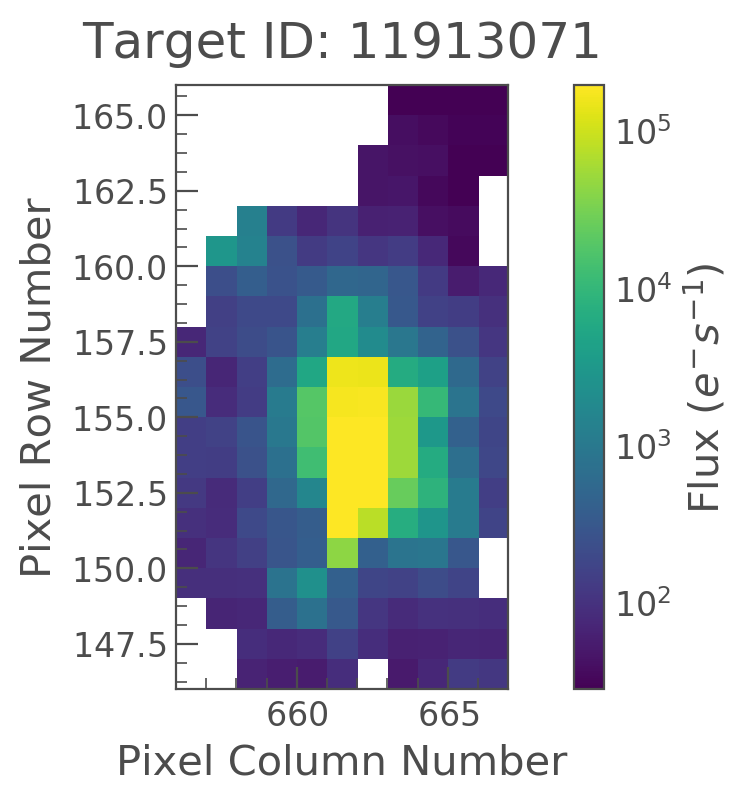

In [335]:
tpf.plot(scale='log')

In [336]:
tpf.row, tpf.column

(146, 656)

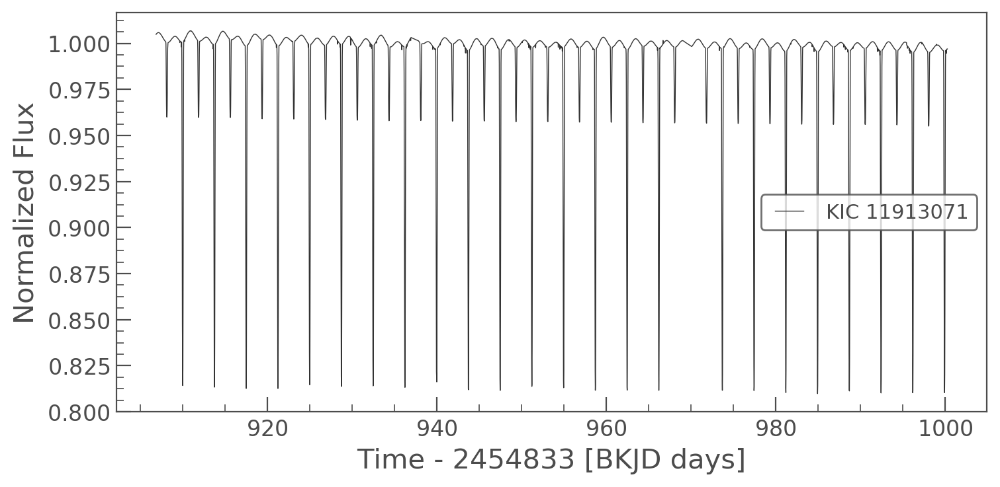

In [337]:
# Take a look!
lc = tpf.to_lightcurve().normalize()
lc.plot()

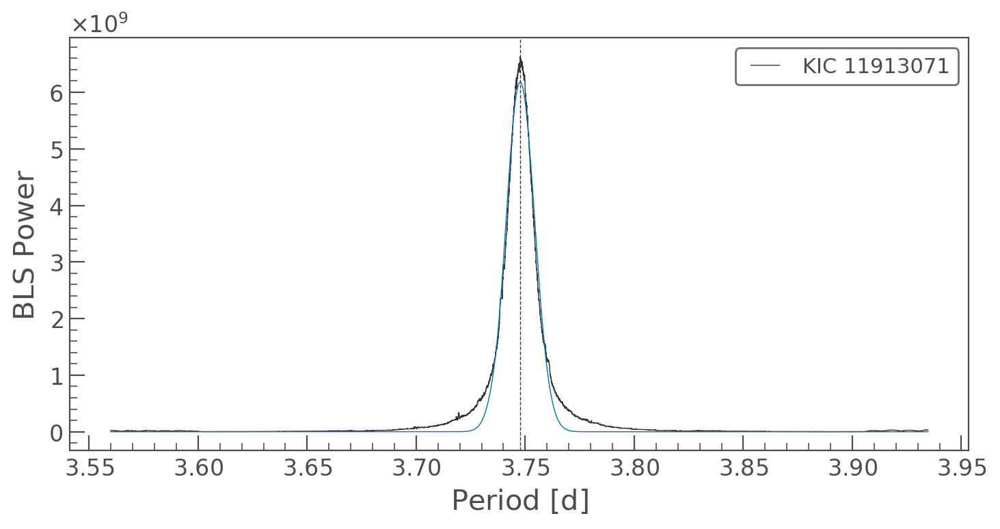

In [338]:
# Find the period and t0 using a BLS!

duration = 0.08
p = lc.to_periodogram('bls', duration=duration, minimum_period=df.loc[idx, 'period']*0.98, maximum_period=df.loc[idx, 'period']*1.02)
period = p.period_at_max_power.value
p = lc.to_periodogram('bls', duration=duration, minimum_period=period * 0.95, maximum_period=period * 1.05, frequency_factor=0.1)

ax = p.plot()
g_init = models.Gaussian1D(p.power.value.max(), p.period.value.mean(), 0.002) + models.Gaussian1D(p.power.value.max()*0.01, p.period.value.mean(), 0.002)
fit = fitting.LevMarLSQFitter()
g = fit(g_init, p.period.value, p.power.value)
mean = getattr(g, 'mean_{}'.format(np.argmax([g.amplitude_0, g.amplitude_1]))).value
ax.plot(p.period.value, g(p.period.value))
plt.axvline(mean, ls='--')
pos = np.argmin(np.abs(p.period.value - mean))
period, t0 = p.period[pos].value, p.transit_time[pos]

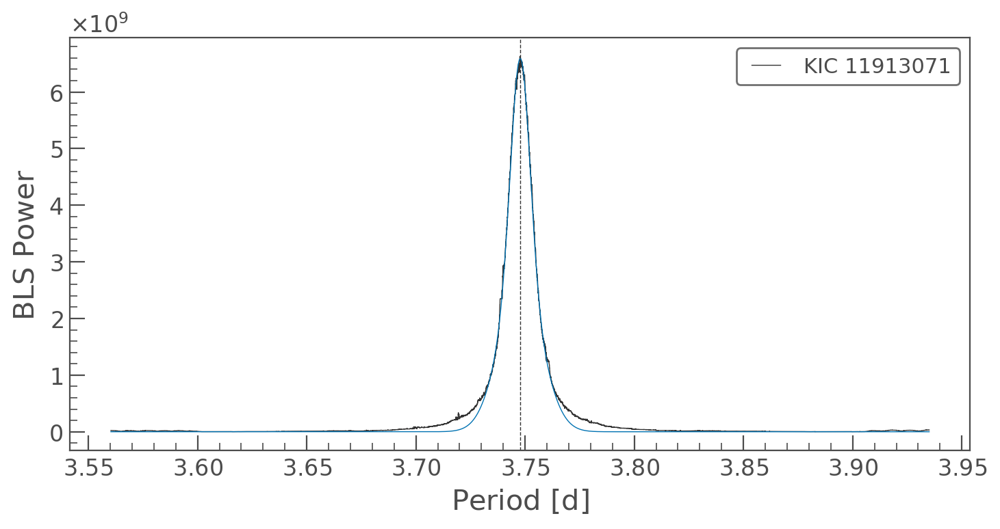

In [339]:
nb = 100
x_fold = (lc.time - t0 - period/2) / period % 1 - 0.5
inds = np.array_split(np.argsort(x_fold), np.linspace(0, len(x_fold), nb + 1, dtype=int))[1:-1]
x_fold_b = np.asarray([np.median(x_fold[ind]) for ind in inds])
flux_b = np.asarray([np.median(lc.flux[ind]) for ind in inds])
flux_b /= np.nanmedian(lc.flux)

func = interp1d(x_fold_b[np.argsort(x_fold_b)], flux_b[np.argsort(x_fold_b)],
                kind='cubic', fill_value='extrapolate')
eb_model = func(x_fold)
clc = lc/eb.poly_detrend(lc, eb_model).flux


p = clc.to_periodogram('bls', duration=duration, minimum_period=period * 0.95, maximum_period=period * 1.05, frequency_factor=0.1)

ax = p.plot()
g_init = models.Gaussian1D(p.power.value.max(), p.period.value.mean(), 0.002) + models.Gaussian1D(p.power.value.max()*0.01, p.period.value.mean(), 0.002)
fit = fitting.LevMarLSQFitter()
g = fit(g_init, p.period.value, p.power.value)
mean = getattr(g, 'mean_{}'.format(np.argmax([g.amplitude_0, g.amplitude_1]))).value
ax.plot(p.period.value, g(p.period.value))
plt.axvline(mean, ls='--')
pos = np.argmin(np.abs(p.period.value - mean))
period, t0 = p.period[pos].value, p.transit_time[pos]

In [340]:
period, t0

(3.7477820221779687, 3.026172848058316)

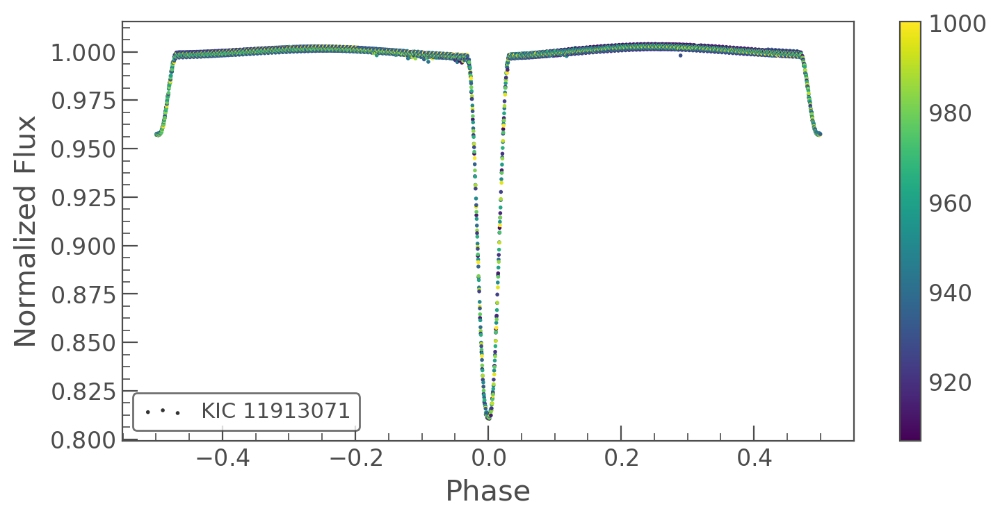

In [341]:
f = clc.fold(period, t0)
f.scatter(c=f.time_original)

/Users/ch/miniconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1172: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/Users/ch/Hacks/TESSparty/chromo/chromo/eb/eb.py:69: RuntimeWarning: invalid value encountered in greater
  saturated = np.nanpercentile(raw_tpf.flux, 90, axis=0) > 40000
Calculating Pixel Light Curves: 100%|██████████| 11/11 [00:00<00:00, 15.81it/s]
/Users/ch/miniconda3/lib/python3.6/site-packages/scipy/stats/stats.py:3010: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
/Users/ch/miniconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:907: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/ch/Hacks/TESSparty/chromo/chromo/eb/utils.py:54: RuntimeWarning: invalid value encountered in greater
  resdat[resdat>0] /= abs(vmax - midpoint)
/Users/ch/Hacks/TESSparty/chromo/chromo/eb/utils.py:55: RuntimeWarning: invalid value encou

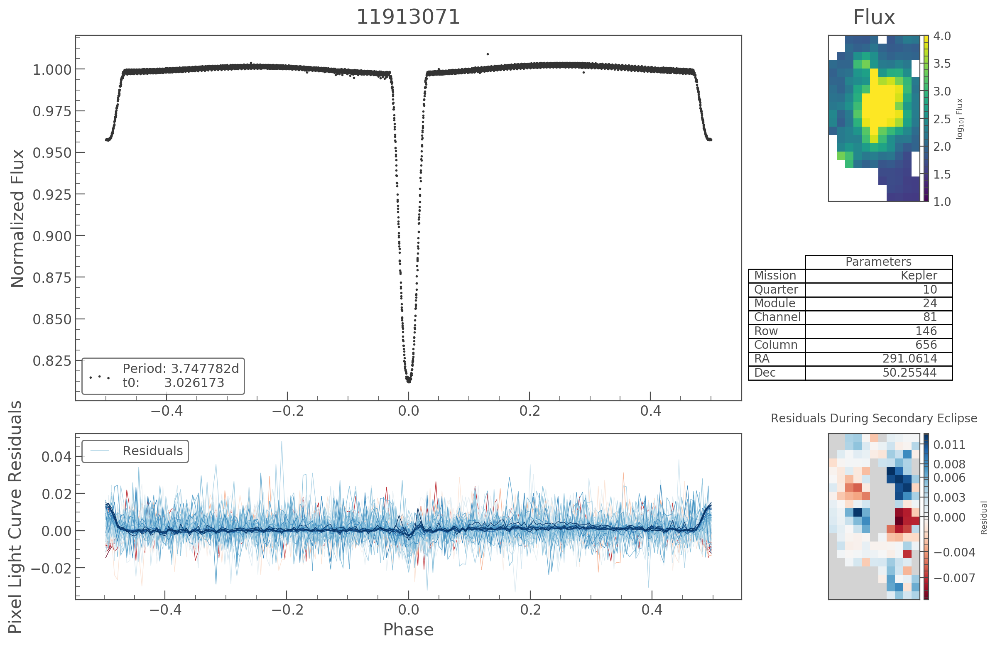

In [342]:
# Use Chromo to analyze! This will make movies in your current directory!
result = eb.analyze(tpf, period, t0, name='{}'.format(df.loc[idx, 'Kepler ID']), nb=200, score_threshold=-1, saturation_aggression=2);

1% (3/476) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
1% (13/1639) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
6% (279/4354) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
5% (230/4370) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
6% (281/4397) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
3% (142/4634) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
3% (122/4398) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
3% (146/4375) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
5% (166/3279) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
3% (150/4768) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
3% (126/4573) of the cadences will

Calculating Pixel Light Curves: 100%|██████████| 11/11 [00:00<00:00, 28.30it/s]
/Users/ch/miniconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1172: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/Users/ch/Hacks/TESSparty/chromo/chromo/eb/eb.py:69: RuntimeWarning: invalid value encountered in greater
  saturated = np.nanpercentile(raw_tpf.flux, 90, axis=0) > 40000
Calculating Pixel Light Curves: 100%|██████████| 11/11 [00:00<00:00, 17.82it/s]
/Users/ch/miniconda3/lib/python3.6/site-packages/scipy/stats/stats.py:3010: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
/Users/ch/miniconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:907: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/ch/Hacks/TESSparty/chromo/chromo/eb/utils.py:54: RuntimeWarning: invalid value encountered in greater
  resdat[resdat>0] /= abs(vmax - midpoint)
/Users/ch/H

ValueError: midpoint must be between maxvalue and minvalue.

/Users/ch/Hacks/TESSparty/chromo/chromo/eb/utils.py:54: RuntimeWarning: invalid value encountered in greater
  resdat[resdat>0] /= abs(vmax - midpoint)
/Users/ch/Hacks/TESSparty/chromo/chromo/eb/utils.py:55: RuntimeWarning: invalid value encountered in less
  resdat[resdat<0] /= abs(vmin - midpoint)


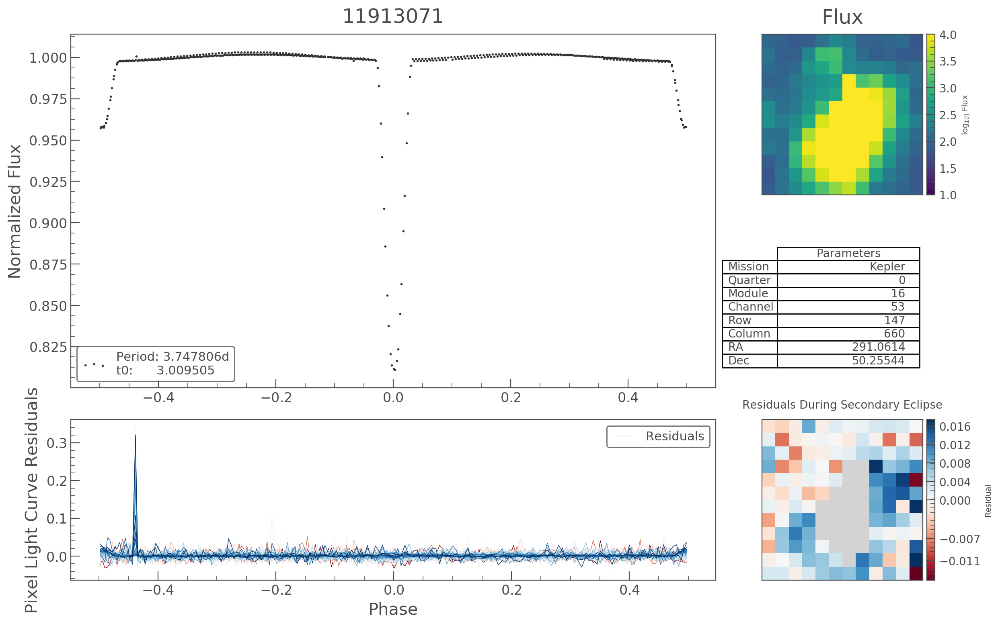

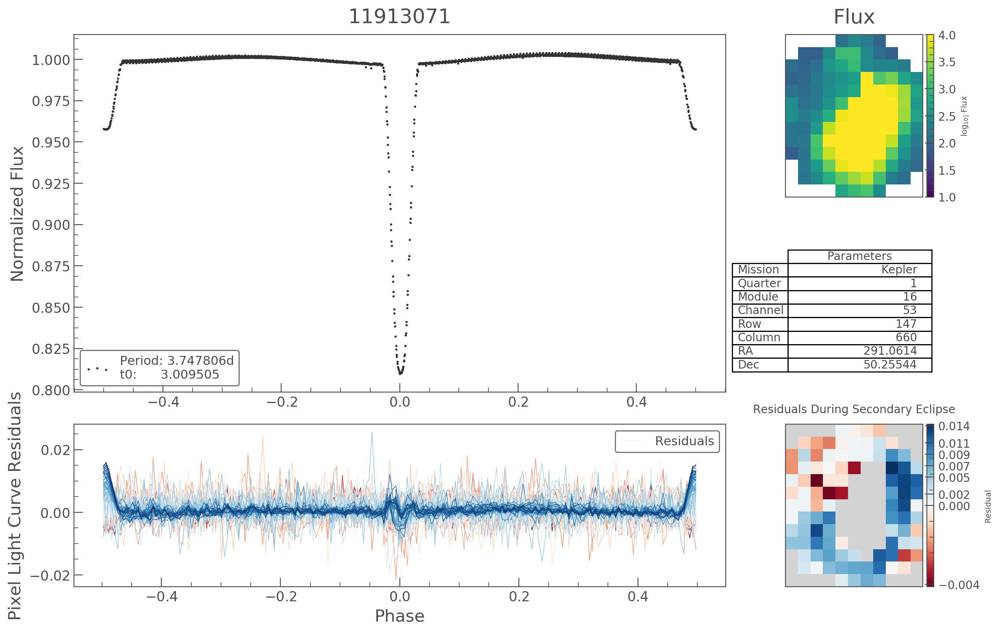

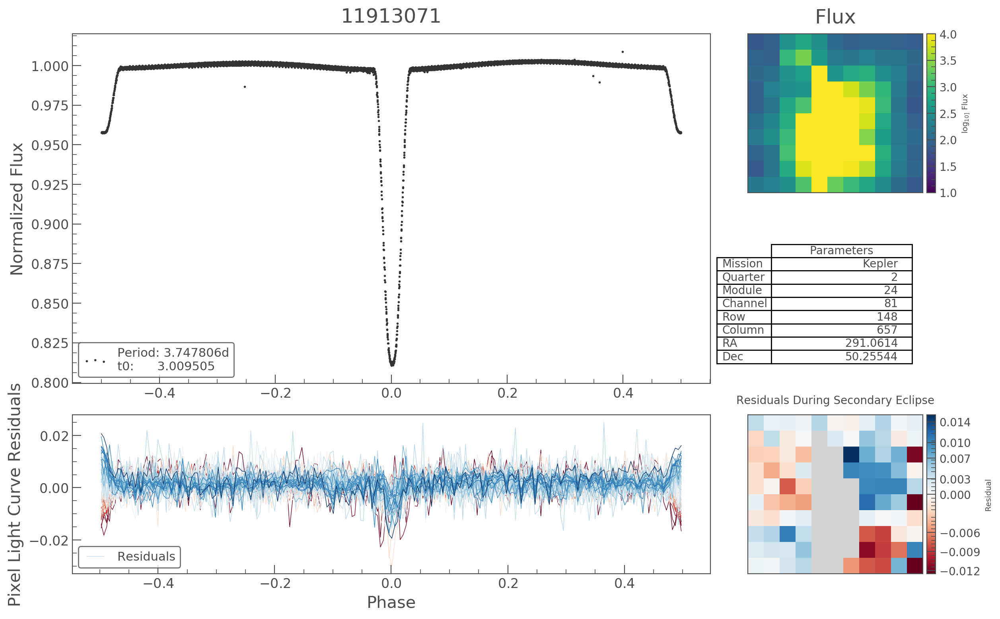

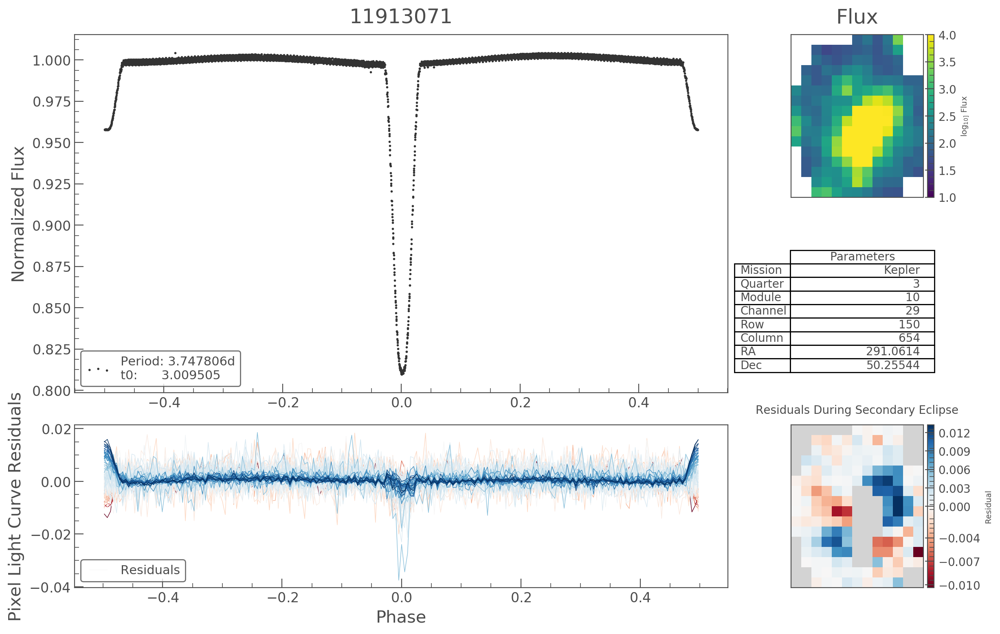

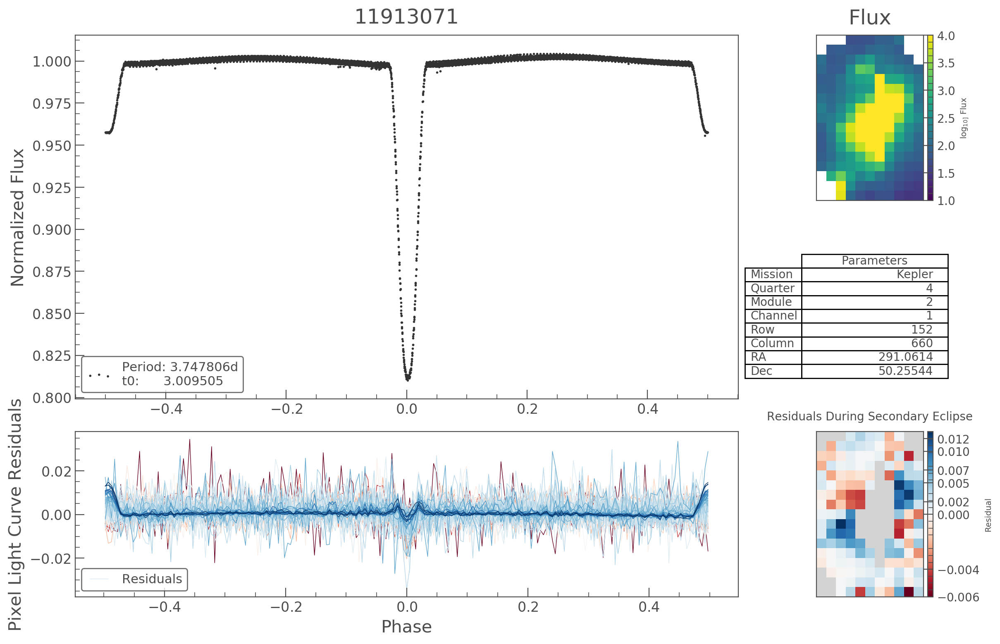

...

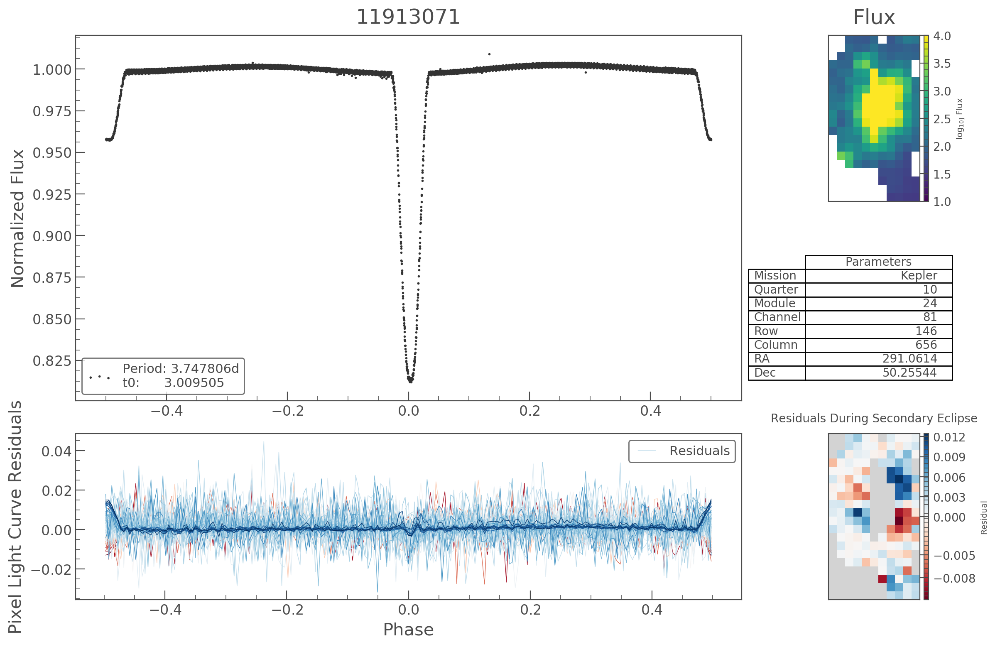

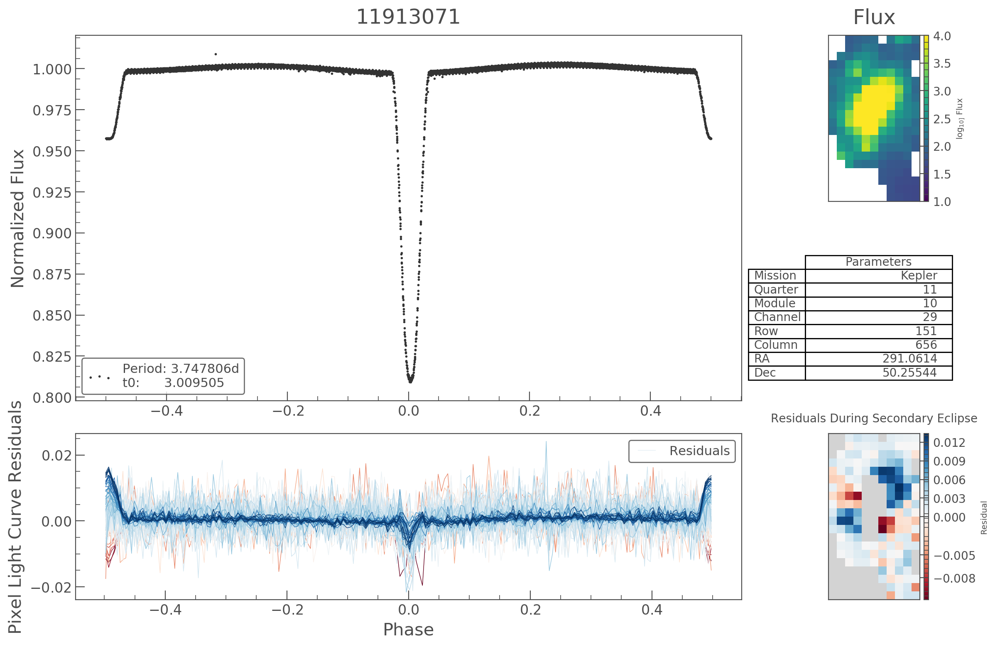

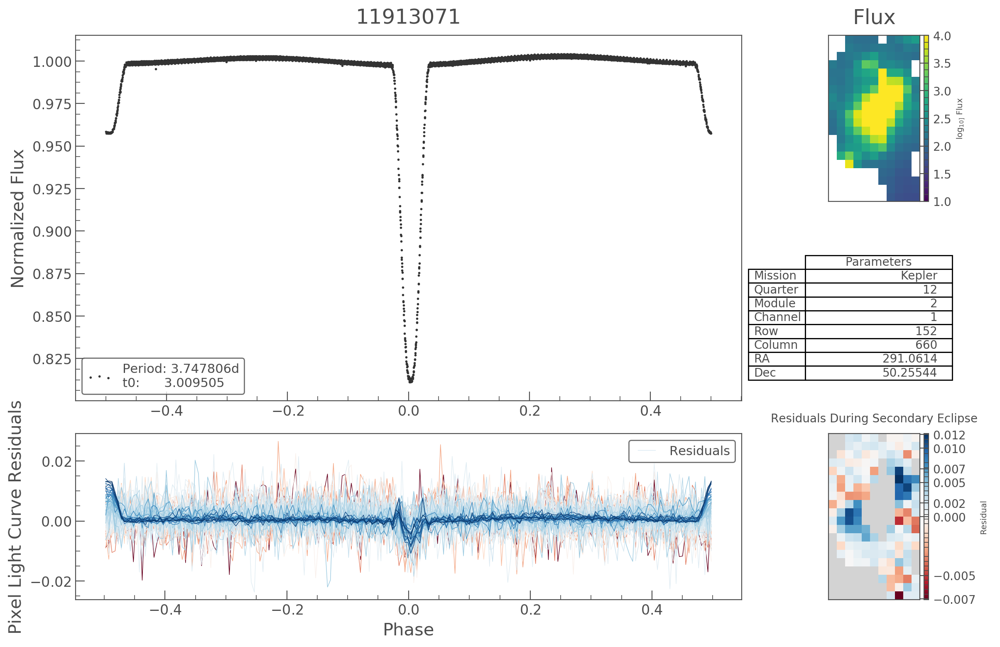

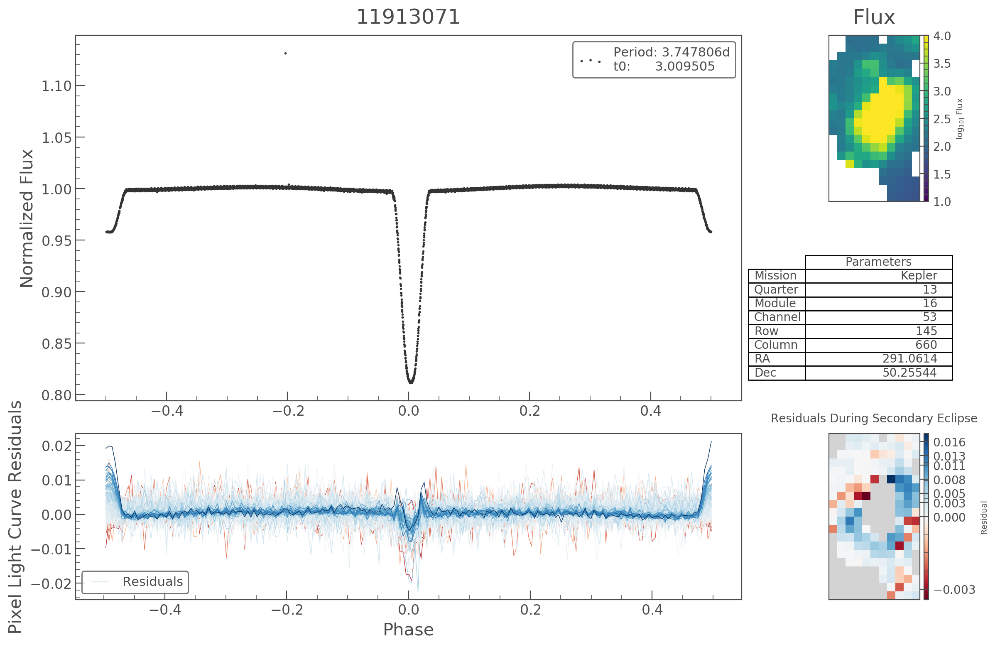

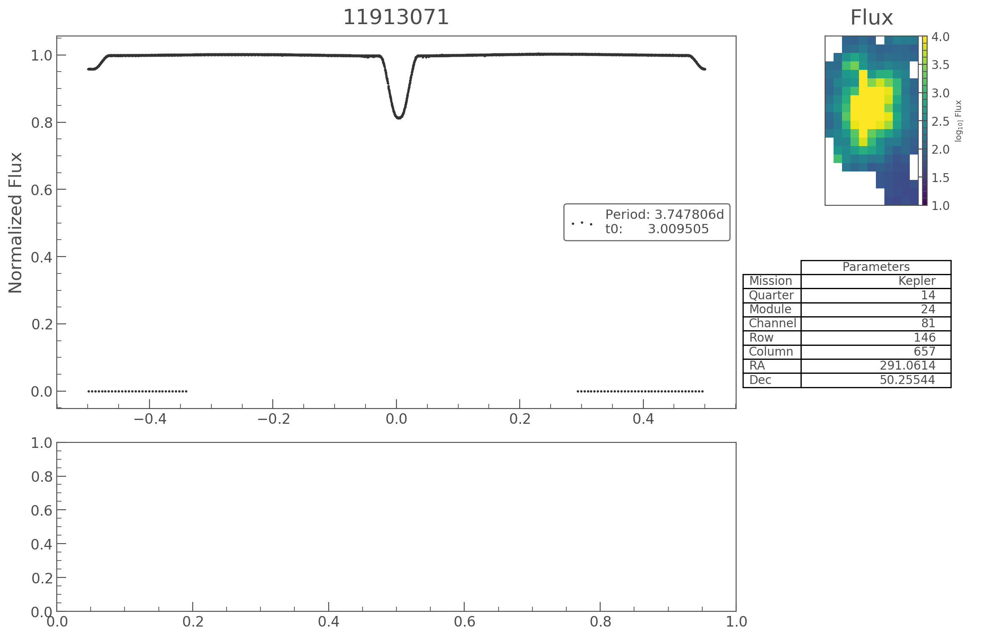

In [251]:
# Use Chromo to analyze all Sectors!
_ = [eb.analyze(tpf, period, t0, name='{}'.format(df.loc[idx, 'Kepler ID']), nb=200, score_threshold=-1, saturation_aggression=2) for tpf in sr.download_all()]